# **AN2DL Challenge 2 - Image Classification**


In [1]:
# Enviroment
isColab = False
colab_dir = "/gdrive/My Drive/Colab Notebooks/[2025-2026] AN2DL/AN2DL-challenge-2"

isKaggle = False
isWsl = True

# Set seed for reproducibility
SEED = 42

## **Loading Enviroment**


In [2]:
import os

# Directory di default
current_dir = os.getcwd()   

if isColab:
    from google.colab import drive # type: ignore
    drive.mount("/gdrive")
    current_dir = colab_dir
    print("In esecuzione su Colab. Google Drive montato.")
    %cd $current_dir
elif isKaggle:
    kaggle_work_dir = "/kaggle/working/AN2DL-challenge-2"
    os.makedirs(kaggle_work_dir, exist_ok=True)
    current_dir = kaggle_work_dir
    print("In esecuzione su Kaggle. Directory di lavoro impostata.")
    os.chdir(current_dir)
elif isWsl:
    local_pref = r"/mnt/g/Il mio Drive/Colab Notebooks/[2025-2026] AN2DL/AN2DL-challenge-2"
    current_dir = local_pref if os.path.isdir(local_pref) else os.getcwd()
    print(f"Esecuzione su WSL. Directory corrente impostata a: {current_dir}")
    os.chdir(current_dir)
else:
    print("Esecuzione locale. Salto mount Google Drive.")
    local_pref = r"G:\Il mio Drive\Colab Notebooks\[2025-2026] AN2DL\AN2DL-challenge-2"
    current_dir = local_pref if os.path.isdir(local_pref) else os.getcwd()
    print(f"Directory corrente impostata a: {current_dir}")
    os.chdir(current_dir)

print(f"Changed directory to: {current_dir}")

# Define absolute paths
dataset_dir = os.path.join(current_dir, "dataset")
train_set_dir = os.path.join(dataset_dir, "train_data")
test_set_dir = os.path.join(dataset_dir, "test_data")
label_file = os.path.join(dataset_dir, "train_labels.csv")

print(f"Dataset directory: {dataset_dir}")
print(f"Train set directory: {train_set_dir}")
print(f"Test set directory: {test_set_dir}")
print(f"Label file: {label_file}")

Esecuzione su WSL. Directory corrente impostata a: /mnt/g/Il mio Drive/Colab Notebooks/[2025-2026] AN2DL/AN2DL-challenge-2
Changed directory to: /mnt/g/Il mio Drive/Colab Notebooks/[2025-2026] AN2DL/AN2DL-challenge-2
Dataset directory: /mnt/g/Il mio Drive/Colab Notebooks/[2025-2026] AN2DL/AN2DL-challenge-2/dataset
Train set directory: /mnt/g/Il mio Drive/Colab Notebooks/[2025-2026] AN2DL/AN2DL-challenge-2/dataset/train_data
Test set directory: /mnt/g/Il mio Drive/Colab Notebooks/[2025-2026] AN2DL/AN2DL-challenge-2/dataset/test_data
Label file: /mnt/g/Il mio Drive/Colab Notebooks/[2025-2026] AN2DL/AN2DL-challenge-2/dataset/train_labels.csv


## **Import Libraries**


In [3]:
# Set environment variables before importing modules
os.environ['PYTHONHASHSEED'] = str(SEED)
os.environ['MPLCONFIGDIR'] = os.getcwd() + '/configs/'

# Suppress warnings
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=Warning)

# Import necessary modules
import logging
import random
import numpy as np

# Set seeds for random number generators in NumPy and Python
np.random.seed(SEED)
random.seed(SEED)

# Import PyTorch
import torch
torch.manual_seed(SEED)
from torch import nn
from torchsummary import summary
import torchvision
from torch.utils.tensorboard import SummaryWriter
from torch.utils.data import TensorDataset, DataLoader
%pip install torchview
from torchview import draw_graph


# Configurazione di TensorBoard e directory
logs_dir = "tensorboard"
if isColab or isKaggle:
    !pkill -f tensorboard 
    !mkdir -p models
    print("Killed existing TensorBoard instances and created models directory.") 

os.makedirs("models", exist_ok=True)  

%load_ext tensorboard


if torch.cuda.is_available():
    device = torch.device("cuda")
    torch.cuda.manual_seed_all(SEED)
    torch.backends.cudnn.benchmark = True
else:
    device = torch.device("cpu")

print(f"PyTorch version: {torch.__version__}")
print(f"Device: {device}")

# Import other libraries
import cv2
import copy
import shutil
from itertools import product
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
from sklearn.model_selection import train_test_split
from PIL import Image
import matplotlib.gridspec as gridspec
import requests
from io import BytesIO
from torch.utils.data import Dataset, DataLoader
from scipy import ndimage
from torch.optim import AdamW

# Configure plot display settings
sns.set(font_scale=1.4)
sns.set_style('white')
plt.rc('font', size=14)
%matplotlib inline

Note: you may need to restart the kernel to use updated packages.
PyTorch version: 2.9.1+cu130
Device: cuda


### **Preparing Dataset for colab**

In [4]:
if isColab:
    drive_dataset_dir = os.path.join(current_dir, "dataset")
    local_dataset_dir = "/content/dataset"

    if not os.path.exists(local_dataset_dir):
        print(f"Copying dataset from {drive_dataset_dir} to {local_dataset_dir}...")
        try:
            shutil.copytree(drive_dataset_dir, local_dataset_dir)
            print("Copy complete.")
        except Exception as e:
            print(f"Error copying dataset: {e}")
            print("Falling back to Drive dataset (slow).")
            # If copy fails, we stick to the original dataset_dir (which might need cleaning too if it was used directly)
            dataset_dir = drive_dataset_dir
    else:
        print("Dataset already copied to local runtime.")

    # If copy succeeded (or already existed), use local path
    if os.path.exists(local_dataset_dir):
        dataset_dir = local_dataset_dir

## ⏳ **Data Loading**


In [5]:
# Loader parameters
BATCH_SIZE = 16
GRAD_ACCUMULATION_STEPS = 2

NORMALIZATION_MEAN = [0.485, 0.456, 0.406]
NORMALIZATION_STD = [0.229, 0.224, 0.225]

IMG_RESIZE = (384, 384)
INPUT_SHAPE = (3, *IMG_RESIZE)

In [6]:
SAMPLES_TO_IGNORE = [
    "img_0001.png",
    "img_0005.png",
    "img_0008.png",
    "img_0012.png",
    "img_0018.png",
    "img_0020.png",
    "img_0022.png",
    "img_0027.png",
    "img_0028.png",
    "img_0036.png",
    "img_0044.png",
    "img_0047.png",
    "img_0048.png",
    "img_0052.png",
    "img_0062.png",
    "img_0078.png",
    "img_0085.png",
    "img_0090.png",
    "img_0094.png",
    "img_0095.png",
    "img_0126.png",
    "img_0129.png",
    "img_0130.png",
    "img_0133.png",
    "img_0136.png",
    "img_0138.png",
    "img_0148.png",
    "img_0150.png",
    "img_0155.png",
    "img_0159.png",
    "img_0161.png",
    "img_0175.png",
    "img_0178.png",
    "img_0179.png",
    "img_0180.png",
    "img_0184.png",
    "img_0187.png",
    "img_0189.png",
    "img_0193.png",
    "img_0196.png",
    "img_0222.png",
    "img_0251.png",
    "img_0254.png",
    "img_0263.png",
    "img_0268.png",
    "img_0286.png",
    "img_0293.png",
    "img_0313.png",
    "img_0319.png",
    "img_0333.png",
    "img_0342.png",
    "img_0344.png",
    "img_0346.png",
    "img_0355.png",
    "img_0368.png",
    "img_0371.png",
    "img_0376.png",
    "img_0380.png",
    "img_0390.png",
    "img_0393.png",
    "img_0407.png",
    "img_0410.png",
    "img_0415.png",
    "img_0424.png",
    "img_0443.png",
    "img_0453.png",
    "img_0459.png",
    "img_0463.png",
    "img_0486.png",
    "img_0497.png",
    "img_0498.png",
    "img_0499.png",
    "img_0509.png",
    "img_0521.png",
    "img_0530.png",
    "img_0531.png",
    "img_0533.png",
    "img_0537.png",
    "img_0540.png",
    "img_0544.png",
    "img_0547.png",
    "img_0557.png",
    "img_0558.png",
    "img_0560.png",
    "img_0565.png",
    "img_0567.png",
    "img_0572.png",
    "img_0578.png",
    "img_0580.png",
    "img_0586.png",
    "img_0602.png",
    "img_0603.png",
    "img_0607.png",
    "img_0609.png",
    "img_0614.png",
    "img_0620.png",
    "img_0623.png",
    "img_0629.png",
    "img_0635.png",
    "img_0639.png",
    "img_0643.png",
    "img_0644.png",
    "img_0645.png",
    "img_0646.png",
    "img_0656.png",
    "img_0657.png",
    "img_0658.png",
    "img_0670.png",
    "img_0673.png",
    "img_0675.png",
]

In [7]:
# Load the full dataframe
full_df = pd.read_csv(label_file)

# Remove cursed images
full_df = full_df[~full_df["sample_index"].isin(SAMPLES_TO_IGNORE)].reset_index(
    drop=True
)

# Label mapping
class_names = sorted(full_df["label"].unique())
label_to_index = {name: idx for idx, name in enumerate(class_names)}
full_df["label_index"] = full_df["label"].map(label_to_index)
num_classes = len(class_names)
print(f"Number of classes: {num_classes}")

Number of classes: 4


### **Definitions**


In [8]:
def make_loader(ds, batch_size, shuffle, drop_last=False):
    """Create a PyTorch DataLoader with optimized settings."""
    cpu_cores = os.cpu_count() or 2
    num_workers = max(2, min(6, cpu_cores))

    return DataLoader(
        ds,
        batch_size=batch_size,
        shuffle=shuffle,
        drop_last=drop_last,
        num_workers=num_workers,
        pin_memory=True,
        pin_memory_device="cuda" if torch.cuda.is_available() else "",
        prefetch_factor=4,
        persistent_workers=isWsl,
    )

In [9]:
from scipy import ndimage
from PIL import Image, ImageOps
import numpy as np
import torch
from torch.utils.data import Dataset
from tqdm.notebook import tqdm
from torchvision.transforms import v2 as transforms


class MaskedFixedTileDataset(Dataset):
    """
    A Dataset class that extracts fixed-size patches from the center of tissue masks
    to preserve biological scale (magnification), rather than resizing variable crops.
    """

    def __init__(
        self,
        dataframe,
        img_dir,
        transforms=None,
        target_size=(224, 224),
        debug_max=None,
    ):
        self.samples = []
        self.transforms = transforms
        self.img_dir = img_dir
        self.target_size = target_size

        # Handling inference mode (no labels) vs training mode
        self.is_inference_mode = False
        if dataframe is None or "label_index" not in dataframe.columns:
            self.is_inference_mode = True
            if dataframe is None:
                # If just a directory, list images
                img_names = sorted(
                    [f for f in os.listdir(img_dir) if f.startswith("img_")]
                )
            else:
                img_names = dataframe["sample_index"].tolist()
            iterator = zip(img_names, [-1] * len(img_names))
            total_items = len(img_names)
        else:
            iterator = zip(dataframe["sample_index"], dataframe["label_index"])
            total_items = len(dataframe)

        print(
            f"Processing {total_items} images to extract fixed-size {target_size} tiles..."
        )

        count = 0
        for img_name, label in tqdm(iterator, total=total_items):
            if debug_max and count >= debug_max:
                break
            self._process_and_extract(img_name, label)
            count += 1

        print(f"Extraction complete. Total patches: {len(self.samples)}")

    def _process_and_extract(self, img_name, label):
        img_path = os.path.join(self.img_dir, img_name)
        mask_path = os.path.join(self.img_dir, img_name.replace("img_", "mask_"))

        try:
            image = Image.open(img_path).convert("RGB")
            mask = Image.open(mask_path).convert("L")
        except Exception as e:
            print(f"Warning: Could not load {img_name}: {e}")
            return

        img_w, img_h = image.size
        # Create binary mask for component labeling
        mask_arr = np.array(mask) > 0

        # Label connected components (blobs) in the mask
        labeled_mask, n_components = ndimage.label(mask_arr)  # type: ignore

        for cid in range(1, n_components + 1):
            # Extract coordinates of the current blob
            ys, xs = np.where(labeled_mask == cid)

            # Filter out very small noise artifacts (< 50 pixels)
            if len(xs) < 50:
                continue

            # Calculate the centroid (center of mass) of the blob
            cy, cx = int(np.mean(ys)), int(np.mean(xs))

            # Define the fixed-size crop window around the centroid
            th, tw = self.target_size
            half_h, half_w = th // 2, tw // 2

            y1 = cy - half_h
            y2 = cy + half_h
            x1 = cx - half_w
            x2 = cx + half_w

            # Handle Edge Cases: Calculate intersection with the actual image
            img_y1, img_y2 = max(0, y1), min(img_h, y2)
            img_x1, img_x2 = max(0, x1), min(img_w, x2)

            # Extract the valid region from the image
            patch_crop = image.crop((img_x1, img_y1, img_x2, img_y2))

            # Calculate required padding if the crop extended beyond image bounds
            pad_left = max(0, -x1)
            pad_top = max(0, -y1)
            pad_right = max(0, x2 - img_w)
            pad_bottom = max(0, y2 - img_h)

            # If padding is needed, pad with white (255) which is standard background in histology
            if pad_left > 0 or pad_top > 0 or pad_right > 0 or pad_bottom > 0:
                patch = ImageOps.expand(
                    patch_crop,
                    border=(pad_left, pad_top, pad_right, pad_bottom),
                    fill=255,
                )
            else:
                patch = patch_crop

            # Ensure precise size match (e.g., if rounding errors occurred)
            if patch.size != self.target_size:
                patch = patch.resize(self.target_size, Image.BICUBIC)  # type: ignore

            # Store in RAM (Efficient for ~2k images yielding ~10k-20k patches)
            self.samples.append(
                {"patch": np.array(patch), "label": label, "parent": img_name}
            )

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        item = self.samples[idx]
        img = Image.fromarray(item["patch"])
        label = item["label"]

        if self.transforms:
            img = self.transforms(img)

        return img, label, item["parent"]

## **Exploratory Data Analysis (EDA)**
Analyzing class distribution, image dimensions, and mask quality.

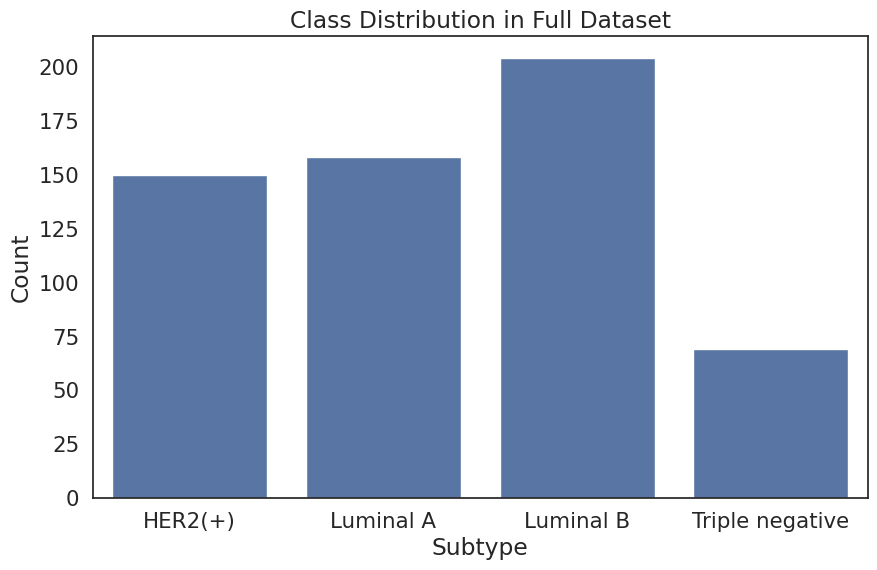

Class counts:
label
Luminal B          204
Luminal A          158
HER2(+)            150
Triple negative     69
Name: count, dtype: int64


In [10]:
# Class Distribution Analysis
plt.figure(figsize=(10, 6))
sns.countplot(data=full_df, x='label', order=sorted(full_df['label'].unique()))
plt.title("Class Distribution in Full Dataset")
plt.xlabel("Subtype")
plt.ylabel("Count")
plt.show()

print("Class counts:")
print(full_df['label'].value_counts())

Analyzing image dimensions...


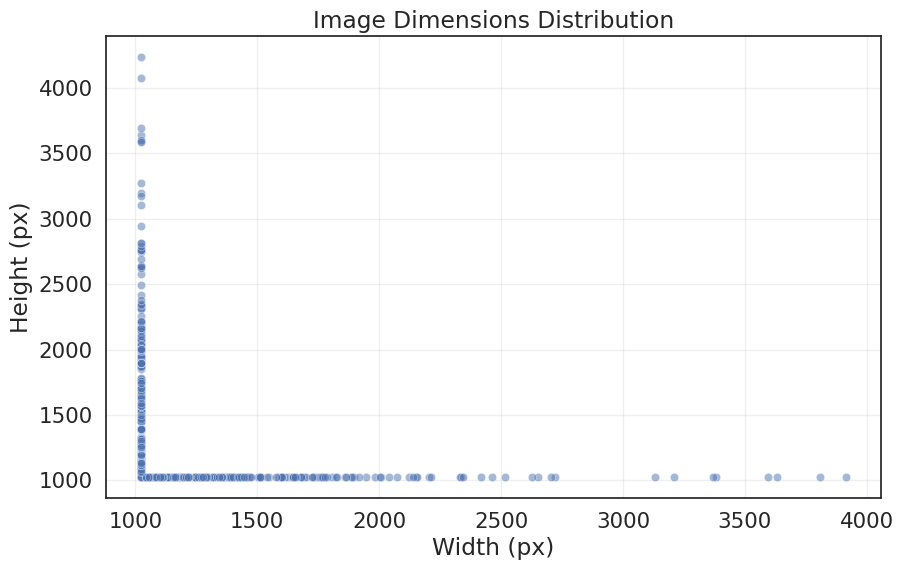

Dimension Statistics:
             Width       Height
count   581.000000   581.000000
mean   1218.860585  1347.304647
std     405.430571   518.200399
min    1024.000000  1024.000000
25%    1024.000000  1024.000000
50%    1024.000000  1097.000000
75%    1259.000000  1481.000000
max    3914.000000  4233.000000


In [11]:
# Image Dimension Analysis
sizes = []
# We'll check a subset to be fast, or all if small enough. 2366 is small enough.
print("Analyzing image dimensions...")
for idx, row in full_df.iterrows():
    img_path = os.path.join(train_set_dir, row['sample_index'])
    try:
        with Image.open(img_path) as img:
            sizes.append(img.size)
    except Exception as e:
        print(f"Error reading {img_path}: {e}")

sizes_df = pd.DataFrame(sizes, columns=['Width', 'Height'])

plt.figure(figsize=(10, 6))
sns.scatterplot(data=sizes_df, x='Width', y='Height', alpha=0.5)
plt.title("Image Dimensions Distribution")
plt.xlabel("Width (px)")
plt.ylabel("Height (px)")
plt.grid(True, alpha=0.3)
plt.show()

print("Dimension Statistics:")
print(sizes_df.describe())

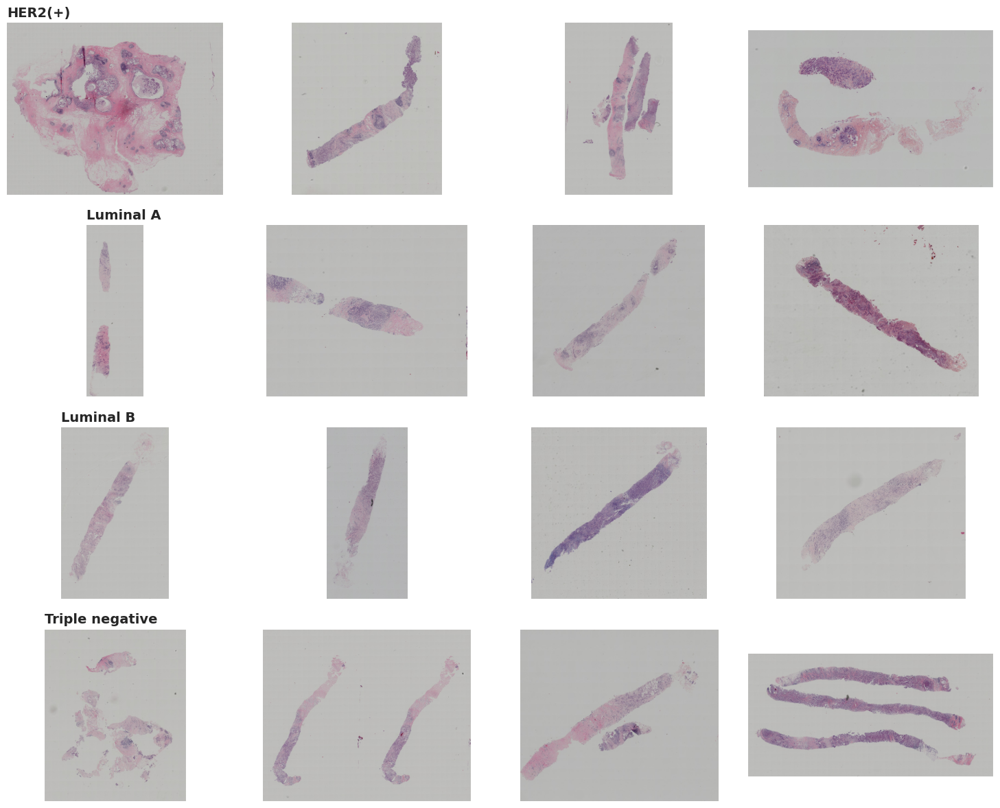

In [12]:
# Visualizing Samples per Class
def visualize_samples(df, num_samples=4):
    classes = sorted(df['label'].unique())
    fig, axes = plt.subplots(len(classes), num_samples, figsize=(15, 3*len(classes)))
    
    for i, cls in enumerate(classes):
        cls_samples = df[df['label'] == cls].sample(num_samples, random_state=SEED)
        for j, (_, row) in enumerate(cls_samples.iterrows()):
            img_path = os.path.join(train_set_dir, row['sample_index'])
            try:
                img = Image.open(img_path)
                axes[i, j].imshow(img)
                axes[i, j].axis('off')
                if j == 0:
                    axes[i, j].set_title(cls, fontsize=14, fontweight='bold', loc='left')
            except Exception as e:
                print(f"Error loading {img_path}: {e}")
                
    plt.tight_layout()
    plt.show()

visualize_samples(full_df)

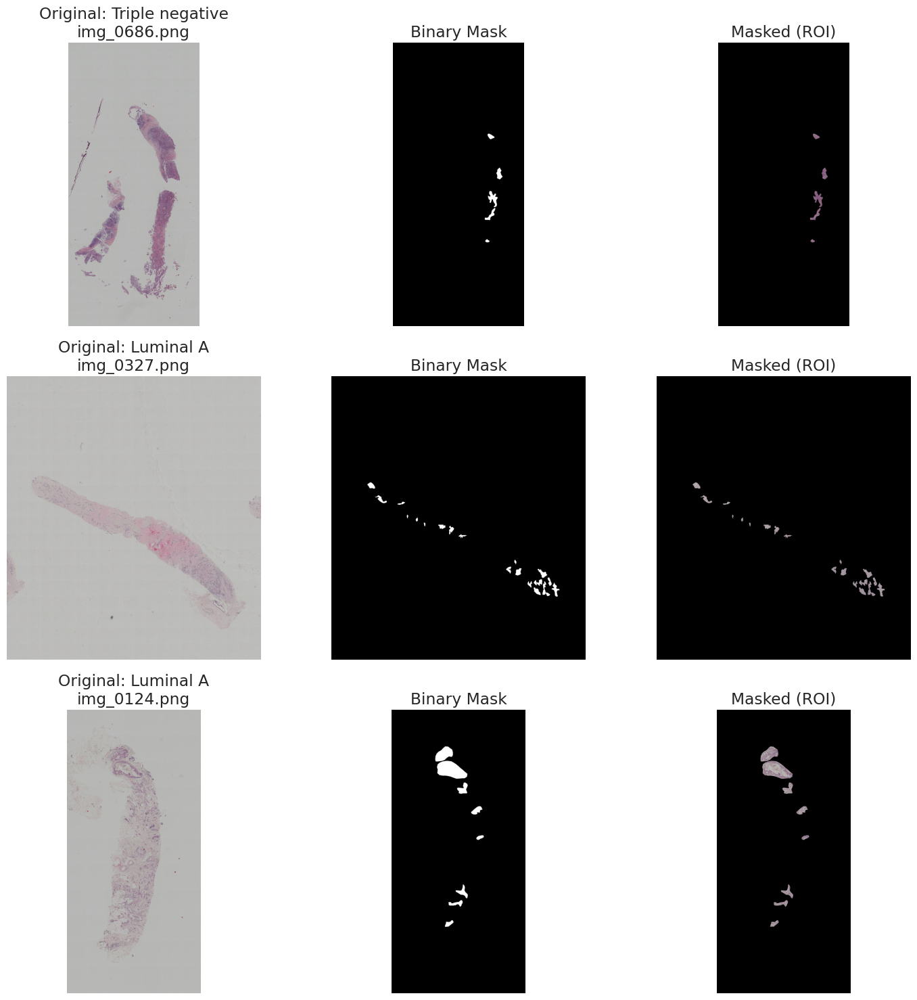

In [13]:
# Mask Analysis: ROI Visualization
def visualize_masks(df, num_samples=3):
    samples = df.sample(num_samples, random_state=SEED)
    fig, axes = plt.subplots(num_samples, 3, figsize=(15, 5*num_samples))
    
    for i, (_, row) in enumerate(samples.iterrows()):
        img_id = row['sample_index']
        mask_id = img_id.replace('img_', 'mask_')
        
        img_path = os.path.join(train_set_dir, img_id)
        mask_path = os.path.join(train_set_dir, mask_id)
        
        try:
            img = Image.open(img_path).convert("RGB")
            mask = Image.open(mask_path).convert("L")
            
            # Apply mask
            img_np = np.array(img)
            mask_np = np.array(mask)
            binary_mask = (mask_np > 0).astype(np.uint8)
            masked_img = img_np * np.expand_dims(binary_mask, axis=-1)
            
            axes[i, 0].imshow(img)
            axes[i, 0].set_title(f"Original: {row['label']}\n{img_id}")
            axes[i, 0].axis('off')
            
            axes[i, 1].imshow(mask, cmap='gray')
            axes[i, 1].set_title("Binary Mask")
            axes[i, 1].axis('off')
            
            axes[i, 2].imshow(masked_img)
            axes[i, 2].set_title("Masked (ROI)")
            axes[i, 2].axis('off')
        except Exception as e:
            print(f"Error processing {img_id}: {e}")
            
    plt.tight_layout()
    plt.show()

visualize_masks(full_df)

In [19]:
# Define transformations

train_transform_tl = transforms.Compose(
    [
        transforms.Resize(IMG_RESIZE),
        transforms.RandomHorizontalFlip(p=0.5),
        transforms.RandomVerticalFlip(p=0.5),
        transforms.ToTensor(),
        transforms.Normalize(mean=NORMALIZATION_MEAN, std=NORMALIZATION_STD),
    ]
)

train_transform_ft = transforms.Compose(
    [
        transforms.RandomResizedCrop(
            IMG_RESIZE, scale=(0.8, 1.0), ratio=(0.8, 1.2), antialias=True
        ),
        transforms.RandomHorizontalFlip(p=0.5),
        transforms.RandomVerticalFlip(p=0.5),
        transforms.RandomRotation(degrees=180),  # type: ignore
        transforms.RandomApply(
            [transforms.ElasticTransform(alpha=50.0, sigma=5.0)], p=0.25
        ),
        transforms.RandomApply(
            [transforms.GaussianBlur(kernel_size=(5, 9), sigma=(0.1, 2.0))], p=0.2
        ),
        transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.02),
        transforms.RandAugment(num_ops=2, magnitude=20),
        transforms.ToTensor(),
        transforms.Normalize(mean=NORMALIZATION_MEAN, std=NORMALIZATION_STD),
        transforms.RandomErasing(
            p=0.2, scale=(0.02, 0.1), ratio=(0.3, 3.3), value="random"
        ),
    ]
)

data_transforms = transforms.Compose(
    [
        transforms.Resize(IMG_RESIZE),
        transforms.ToTensor(),
        transforms.Normalize(mean=NORMALIZATION_MEAN, std=NORMALIZATION_STD),
    ]
)

In [20]:
def unnormalize(img, mean, std):
    img = np.array(img, copy=True)
    for c in range(3):
        img[c] = img[c] * std[c] + mean[c]
    return np.clip(img, 0, 1)


def show_mask_patch_effect(dataset, transforms, n=3):
    parents = list({s["parent"] for s in dataset.samples})
    parents = random.sample(parents, min(n, len(parents)))

    for img_name in parents:
        img_path = os.path.join(dataset.img_dir, img_name)
        mask_path = os.path.join(dataset.img_dir, img_name.replace("img_", "mask_"))

        image = np.array(Image.open(img_path).convert("RGB"))
        mask = np.array(Image.open(mask_path).convert("L")) > 0

        labeled_mask, n_components = ndimage.label(mask)  # type: ignore

        fig = plt.figure(figsize=(4 * (n_components + 1), 5))
        gs = fig.add_gridspec(1, n_components + 1)

        # Originale + maschera
        ax0 = fig.add_subplot(gs[0])
        ax0.imshow(image)
        ax0.imshow(mask, alpha=0.4, cmap="Reds")
        ax0.set_title("Originale + Maschera")
        ax0.axis("off")

        col = 1
        for cid in range(1, n_components + 1):
            ys, xs = np.where(labeled_mask == cid)
            if len(xs) < 15:
                continue

            x1, x2 = xs.min(), xs.max()
            y1, y2 = ys.min(), ys.max()

            patch = image[y1:y2, x1:x2]
            patch_pil = Image.fromarray(patch)

            train_img = transforms(patch_pil)
            train_img = unnormalize(
                train_img.numpy(), NORMALIZATION_MEAN, NORMALIZATION_STD
            )

            ax = fig.add_subplot(gs[col])
            ax.imshow(np.transpose(train_img, (1, 2, 0)))
            ax.set_title(f"Patch {cid}")
            ax.axis("off")
            col += 1

        plt.suptitle(f"{img_name} – Patch estratte dai blob", fontsize=14)
        plt.show()

In [16]:
train_dataset = MaskedFixedTileDataset(
    dataframe=full_df,
    img_dir=train_set_dir,
    transforms=data_transforms,
    target_size=IMG_RESIZE,
    debug_max=None,
)

Processing 581 images to extract fixed-size (384, 384) tiles...


  0%|          | 0/581 [00:00<?, ?it/s]

Extraction complete. Total patches: 4955


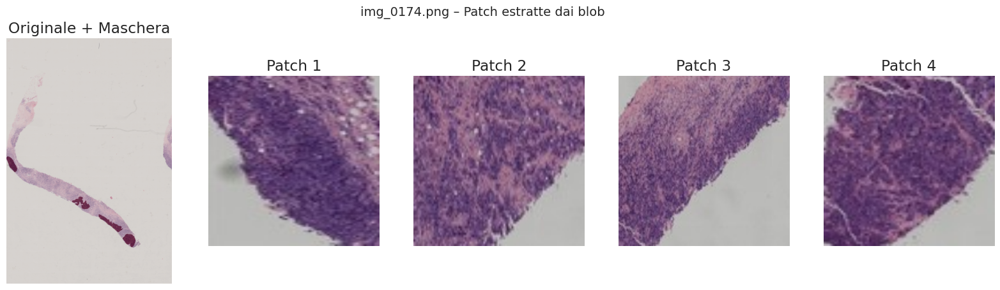

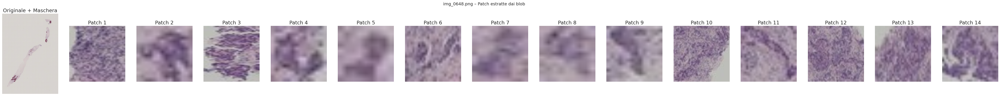

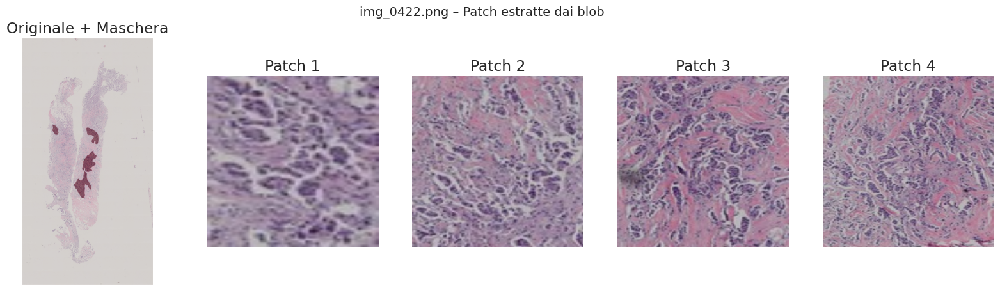

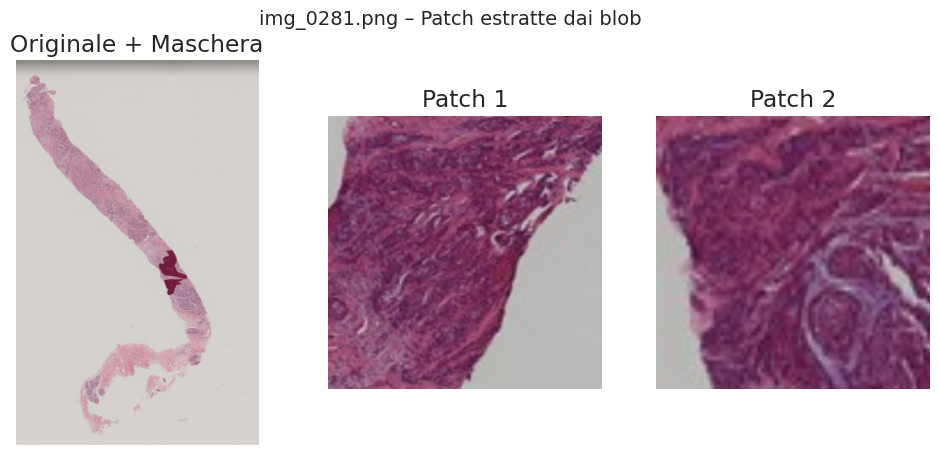

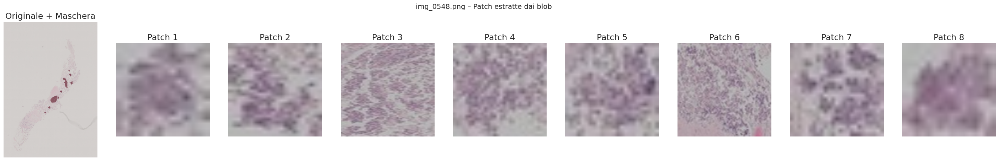

In [17]:
show_mask_patch_effect(
    dataset=train_dataset,
    transforms=train_transform_tl,
    n=5,
)

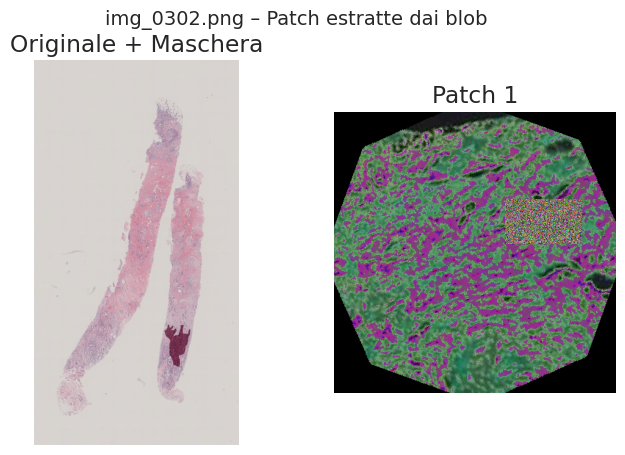

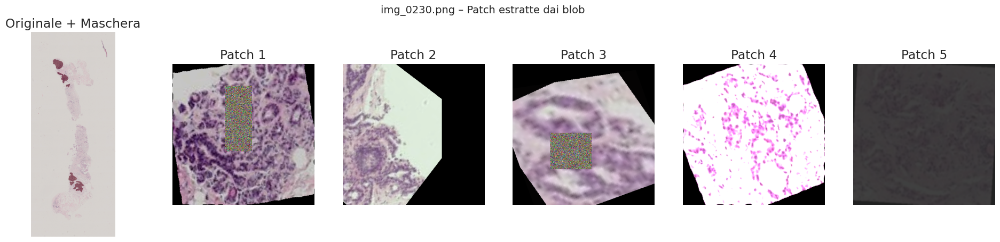

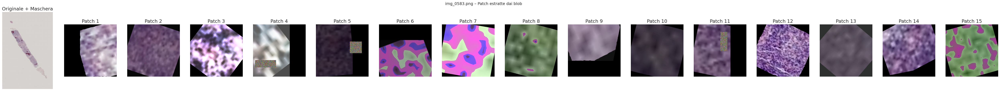

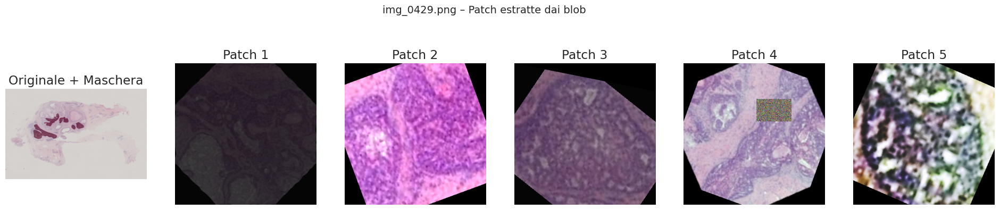

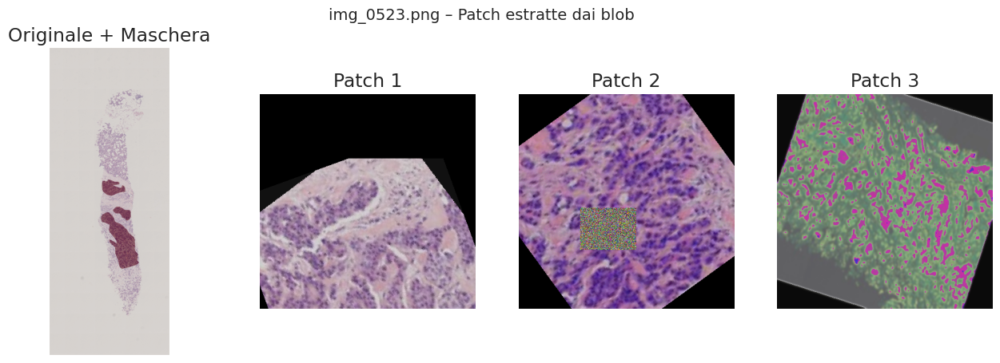

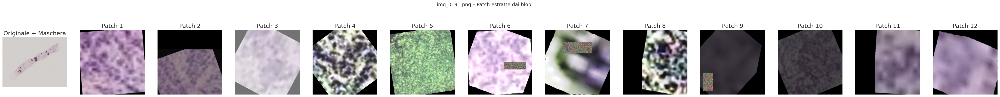

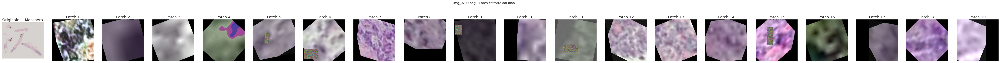

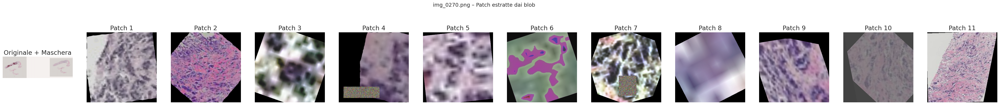

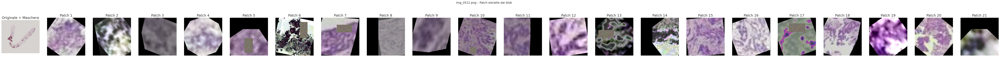

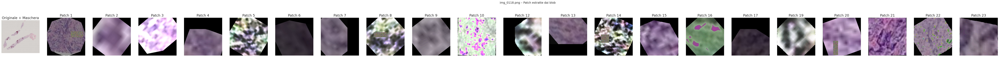

In [21]:
show_mask_patch_effect(
    dataset=train_dataset,
    transforms=train_transform_ft,
    n=10,
)